# Resutls of the mission I chose to accept

**Note** 
- This is the first time I am working on a VAD, or with voice data in general, so please excuse my lack indepht knowledge on the differnet pre-processing steps, model selection etc.
- Apologies for using a python notebook, it might seem less professional, but I find it a lot easier to explain my train of thought while walking you through my code and respective results. 
- If a function call hasn't been defined at a particular cell, pease head to section '1.2 - Helper Functions' to find the same


# RNNs for Voice Activity Detection

## 1 - Introduction

The objective of this challenge was to create a VAD using deep learning techniques. In today's world VAD algorithms are used more often than ever as a pre-processing algorithm, with its uses seen in speech coding, speech recognition and speech enchancement. This being said it can be considered as a resource saving operation.

To me the successful completion of the challenge entailed three principle steps (with their repective nuances of course):
- Put together the dataset
- Put together the Neural Network 
- Feed Neural Network with the dataset and record results and learnings.

Let's get right into it

### 1.1 - Dependencies

In [368]:
## Dependencies
import os
import sys
import wave
import json
import pickle
import random
import IPython
import numpy as np
from scipy.io import wavfile
from tabulate import tabulate
from pydub import AudioSegment
import matplotlib.pyplot as plt


from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, Conv1D
from keras.layers import GRU, Bidirectional, BatchNormalization
from keras.optimizers import Adam

%matplotlib inline

### 1.2 - Helper Functions

In [461]:
def plot_wav(wav_path):
    """
    Function to plot the wav file
    
    Args:
    - wav_path (str): the path of the wav file to be plotted
    
    """
    
    rate, data = wavfile.read(wav_path)
    data = data.reshape((len(data),-1))
    
    Time = np.linspace(0, len(data)/rate, num=len(data))
    plt.title("Signal Wave")
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.plot(Time,data)

    
def plot_spectrogram(wav_path):
    """
    Function to plot spectrogram / get spectrogram output
    
    Args:
    - wav_path (str): the path of the wav file to be plotted
    
    Returns:
    - plot (nd.array): the output spectrogram
    """
    
    rate, data = wavfile.read(wav_path)
    data = data.reshape((len(data),-1))
    print("The sampling rate and length of the audio file {} is {} and {}".format(wav_path, rate, len(data)))
    window = 200 # Window size
    noverlap = 120 # overlap between windows
   
    # Plotting
    plt.title('Spectrogram')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequence (Hz)')
    plot, freqs, bins, im= plt.specgram(data[:,0], window, rate, noverlap = noverlap)
    
    return plot


def wav_moulding(wav_path, save_path = 'Audio_data/Background/', startMin = 0, startSec = 0, endMin = 0, endSec = 10):
    """
    Function to create 20sec background wav_files
    
    Args:
    - wav_path (str): the path of the wav file to be plotted
    - startMin (int): start time in minutes of the interested domain
    - startSec (int):  start time in seconds of the interested domain
    - endMin (int): end time in minutes of the interested domain
    - endSec (int):  end time in seconds of the interested domain
    """
    
    startMin = startMin
    startSec = startSec
    endMin = endMin
    endSec = endSec

    # Time to miliseconds
    startTime = startMin*60*1000+startSec*1000
    endTime = endMin*60*1000+endSec*1000

    # Opening file and extracting segment
    song = AudioSegment.from_wav(wav_path)
    extract = song[startTime:endTime]
    extract = extract * 2
    
    # Saving
    extract.export(save_path + wav_path[-8:-4]+'_extended.wav', format="wav")

    
def load_wavs(bg_path ="./Audio_data/Background/" , audio_path = './vad_data/'):
    """
    Using pydub to read wav files to be able to manipulate them
    before they are fed into the RNN.
    
    Args:
    - bg_path (str): path to the Background data
    - audio_path (str): path to the audio data
    
    Returns:
    - backgrounds (list): list of background pydub data structures (1ms discretization)
    - audios (list): list of audio pydub data structures (1ms discretization)
    """
   
    backgrounds = []
    audios = []
 
    for filename in sorted(os.listdir(bg_path)):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav(bg_path+filename)
            backgrounds.append(background)
            
    for filename in sorted(os.listdir(audio_path)):
        if filename.endswith("wav"):
            audio = AudioSegment.from_wav(audio_path+filename)
            audios.append(audio)
            
    return backgrounds, audios


def random_select(audio):
    """
    The function gets the audio file in order to determine
    its radom placement onto the background file
    
    Args:
    - audio : pydub audio data structure
    
    Returns:
    - start_point (int): randomly selected starting point for audio
                         on background file
    - end_point (int):end point for audio on background file
    """
    
    start_point = np.random.randint(1, 20000-len(audio))
    end_point = start_point + len(audio) - 1
    
    return (start_point, end_point)
    
    
def superimpose_audio(background, audio):
    """
    The function superimposes the audio wav file onto the 
    background wav file
    
    Args:
    - Background : pydub background data structure
    - audio : pydub audio data structure
    
    Returns:
    - new_background : new pydub data structure with audio 
                       data structure superimposed on background
                       data structure
    - start_point (int): randomly selected starting point for audio
                         on background file
    - end_point (int):end point for audio on background file
    """
    
    start_point, end_point = random_select(audio)
    new_background = background.overlay(audio, position = start_point)
    
    return new_background, (start_point, end_point)


def load_labels(base_path = 'vad_data/'):
    """
    Loads the .json labels file
    
    Args:
    - base_path (str): path where the labels lie 
    
    Returns:
    - labels (list): list of dictionaries with start and end times
                     of voice for corresponding audio files
    """
    
    labels = list()
    
    for filename in sorted(os.listdir(base_path)):
        if filename.endswith('.json'):
            with open(base_path + filename) as f:
                data = json.load(f)
                labels.append(data['speech_segments'])
    
    return labels


def create_label(start_end_time, label):
    """
    This function works on the labels of the VAD network
    
    Args:
    - start_end_time (tuple): integer tuple indicating start and
                              end times of respective audio on 
                              background
    - label (list): list of dictionaries with start and end times
                     of voice for corresponding audio files
                     
    Returns:
    - Y (nd.array): a binary array of dimension (1,2753) indicating 
                    sections of speech(1) and no-speech(1)
    """
    
    Y = np.zeros((1, 2753))
    start, end = start_end_time
    
    ## Create list of start and stop times
    dict_temp = dict()
    dict_temp['start_time'] = list()
    dict_temp['end_time'] = list()
    for l in label:
        for key, val in l.items():
            dict_temp[key].append(((val/20) + (start/20000))*2753)
    
    ## Iterating through the range of start and stop times
    start_times = dict_temp['start_time']
    stop_times = dict_temp['end_time']
    for i in range(len(start_times)):
        Y[:,round(start_times[i]):round(stop_times[i])] = 1
        
    return Y


def standardize(audio, target_dBFS):
    """
    Standardize the volume of the audio clip 
    
    Args:
    - audio : pydub audio data structure
    - target_dBFS (float): Decibels relative to full scale
    
    Returns: Standardized volume of audio clip
    """
    change_in_dBFS = target_dBFS - audio.dBFS
    
    return audio.apply_gain(change_in_dBFS)
    
    
def splits(dataset, idx):
    """
    Create RNN edible train, dev and test sets
    
    Args:
    - dataset (list): A list of tuples with containting (data,label)
                      values
    - idx (list): A list of indices that would correspond to a subset
                  of the dataset
                  
    Returns:
    - X_temp (nd.array): An array of audio input of dimension (len(idx), 11203, 101)
    - Y_temp (nd.array): An array of label corresponding to audio input of 
                         dimension (len(idx), 2753, 1)
    """
    
    X_shape = (len(idx), dataset[1][0].shape[1], dataset[1][0].shape[0])
    Y_shape = (len(idx), dataset[1][1].shape[1], dataset[1][1].shape[0])
    X_temp = np.zeros(X_shape)
    Y_temp = np.zeros(Y_shape)
    
    for n,i in enumerate(idx):
        X_temp[n] = dataset[n][0].transpose(1,0)
        Y_temp[n] = dataset[n][1].transpose(1,0)
        
    return X_temp, Y_temp

    
def evaluate(Y_test, Y_pred_binary):
    """
    Calculates the average True Positive, False Positve, True
    negative and False Negative rates
    
    Args:
    - Y_test (nd.array): an array of dimensions (157x2753x1) indicating
                         speech and no-speech sections of the corresponding
                         instance in X_test object
    
    - Y_pred_binary (nd.array): an array of dimensions (157x2753x1) indicating
                                predicted speech and no-speech sections 
                                when object X_test is fed into trained RNN model
                              
    Returns: tupele of average True Positive, False Positve, True
    negative and False Negative rates
    - 
    """
    
    sum_TP = 0
    sum_FP = 0
    sum_TN = 0
    sum_FN = 0
    
    for instance in range(len(Y_test)):

        temp_true_1, _ = np.where(Y_test[instance] == 1)
        temp_true_0, _ = np.where(Y_test[instance] == 0)
        temp_pred_1, _ = np.where(Y_pred_binary[instance] == 1)
        temp_pred_0, _ = np.where(Y_pred_binary[instance] == 0)

        sum_TP += sum([1 if temp_pred_1[i] in temp_true_1 else 0 for i in range(len(temp_pred_1))])/len(temp_pred_1)
        sum_FP += sum([1 if temp_pred_1[i] not in temp_true_1 else 0 for i in range(len(temp_pred_1))])/len(temp_pred_1)
        sum_TN += sum([1 if temp_pred_0[i] in temp_true_0 else 0 for i in range(len(temp_pred_0))])/len(temp_pred_0)
        sum_FN += sum([1 if temp_pred_0[i] not in temp_true_0 else 0 for i in range(len(temp_pred_0))])/len(temp_pred_0)

    avg_TP = sum_TP/len(Y_test)
    avg_TN = sum_TN/len(Y_test)
    
    return avg_TP, (1-avg_TP), avg_TN, (1-avg_TN)
    

## 2 - Data Synthesis

This part will focus on constructing the dataset that will eventually be fed into the VAD algorithm.

### 2.1 - Listening to a ramdom audio samples

In this sub-section the [[audio wav files](https://s3.amazonaws.com/snips/challenge/vad_data.tar.gz)] and [[background wav files](https://github.com/hcmlab/vadnet/blob/master/data/noise.wav)] - the background files were then parsed and only few sections were selected (submitted along with the notebook) - read and summarized. 

In [417]:
## Read audio and background paths and pick one randomly to listen 
base_audio_path ='Audio_data/vad_data/'
base_background_path = 'Audio_data/Background/background_original/'

audio_list = [audio for audio in sorted(os.listdir(base_audio_path)) if 
            audio.endswith(".wav")]
background_list = [bg for bg in sorted(os.listdir(base_background_path))
                   if bg.endswith(".wav")]
print("There are {} audio recordings and {} background recordings".format(len(audio_list), len(background_list)))


## About the audio recordings

time = list()
for audio_name in audio_list:
    temp_wav_file = base_audio_path + audio_name
    rate, data = wavfile.read(temp_wav_file)
    time.append(len(data)/rate)
    
print("The maximum and minimum lenghts of the audio recordings are {} s and {} s".format(max(time), min(time)))
print("The averge length of an audio recordings is %4.2f s " % (sum(time)/len(time)))
print("The backgorund recording are 10 sec each")


There are 957 audio recordings and 7 background recordings
The maximum and minimum lenghts of the audio recordings are 17.205 s and 1.41 s
The averge length of an audio recordings is 12.33 s 
The backgorund recording are 10 sec each


Audio recording index 879 with file name 1867-148436-0042.wav


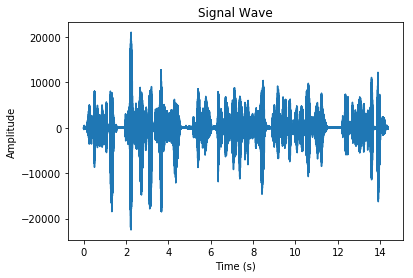

In [414]:
## Display, Plot and listen random audio file

idx_audio = np.random.choice(len(audio_list),1)[0]
random_audio_select = audio_list[idx_audio]
print("Audio recording index {} with file name {}".format(idx_audio, random_audio_select))
audio_wav_file = base_audio_path + random_audio_select

plot_wav(audio_wav_file)
IPython.display.Audio(audio_wav_file)

Background recording index 2 with file name bg_3.wav


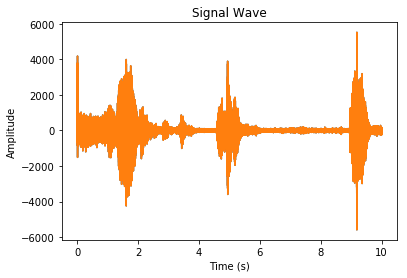

In [419]:
## Display and listen random background file

random_background_select = background_list[idx_background]
print("Background recording index {} with file name {}".format(idx_background, random_background_select))
bg_wav_file = base_background_path + random_background_select
plot_wav(bg_wav_file)
IPython.display.Audio(bg_wav_file)

Now that I have a superficial idea about the data i'm working with, I shall move forward with tweaking the data so as to be edible by an RNN.

### 2.2 - Audio Recodings through Spectrograms

Working with the raw audio is not adviced as it's hard to discriminate the parts of which that realate to actual speech, no-speech or background noise. Hence the raw audio signal is transformed from its time domain to frequency domain using fourier transforms, which in turn give us a spectogram that alows one to capture the most active frequencies - in my case the most active 101 frequencies.

The sampling rate and length of the audio file Audio_data/vad_data/1867-148436-0042.wav is 16000 and 229920
The output spectrogram has dimensions (101, 2872)


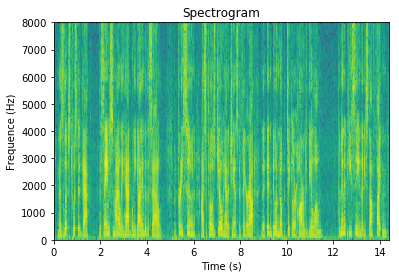

In [420]:
## Visualizing Audio file output from spectrogram

audio_spectogram = plot_spectrogram(audio_wav_file)
print('The output spectrogram has dimensions {}'.format(audio_spectogram.shape))

The sampling rate and length of the audio file Audio_data/Background/background_original/bg_3.wav is 44100 and 441000
The output spectrogram has dimensions (101, 5511)


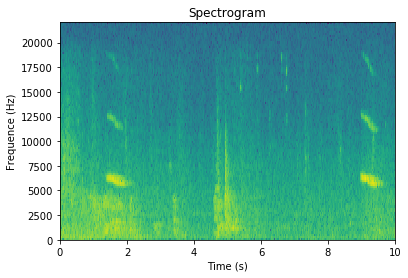

In [421]:
## isualizing Background file output from spectrogram
audio_spectogram = plot_spectrogram(bg_wav_file)
print('The output spectrogram has dimensions {}'.format(audio_spectogram.shape))

From the spectrogram output we can make the distinction from high and low energy zones.
So now that I know that information from audio files are best extracted when dealing with its output through a spectrogram, i'll be using this in the next section while putting together the dataset.

### 2.3 - Dataset Generation

In this section i'll be putting together datase that will have to be fed into the VAD algorithm. Since, the audio recordings are rather silent, i'll be superimposing it on to randomly selected background recordings in order to simulate real case scenarios. 

To synthesize each training example i'll:
- Pick a random background (each background is about 10 secs) and double it's length (20 sec)
- Randomly superimpose an audio - such that it fits within the 20 sec limit - on to the selected background file.
- Create labels in accordance with the newly generated dataset.


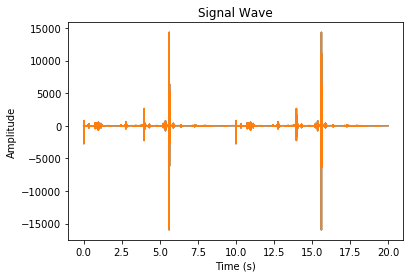

In [442]:
## Create 20 sec background audio files
for bg_wav in background_list:
    wav_moulding(base_background_path+bg_wav)

## Plotting and listening
bg_wav_file = "Audio_data/Background/" + 'bg_2_extended.wav'
plot_wav(bg_wav_file)
IPython.display.Audio(bg_wav_file)

The sampling rate and length of the audio file Audio_data/Background/bg_2_extended.wav is 44100 and 882000
The output spectrogram has dimensions (101, 11023)


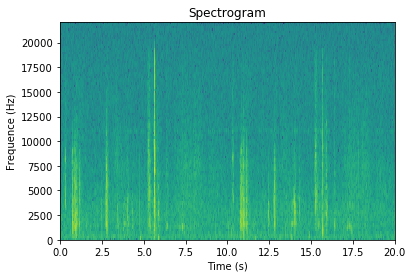

In [443]:
temp = plot_spectrogram(bg_wav_file)
print("The output spectrogram has dimensions {}".format(temp.shape))

Since i'll be superimposing audio wav onto the background wav, the output from the spectrogram will remain (101, 11023). And so will be the input to  the RNN that will be defined in a later section. I'll also be using a convolution layer at the first step of the network to encode the input to a smaller dimension = 2753. So the expected ouput too from the network would have 2753 elements.
- T_x = 11023
- T_y = 2753

Now I'll be loading the background and audio wav files using the pydub package in order to effectuate the earlier mentioned manupulations on wav files.

In [102]:
## Load wav files using pydub
backgrounds, audios = load_wavs()
print("The background lengths are {}".format(len(backgrounds[1])))
print("The audio files' lengths range from {} to {}".
      format(len(audios[time.index(min(time))]), 
             len(audios[time.index(max(time))])))

The background lengths are 20000
The audio files' lengths range from 1410 to 17205


Since the pydub package used 1ms as discretization interval, the 20 second clip is now a data structure with 20000 points and similary the ranges of lengths of the audio file.

Start and end points:  (332, 15506)


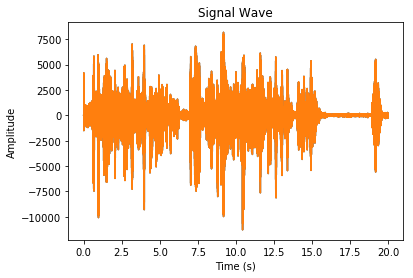

In [444]:
## Select an audio wav file and superimpose it on a random background
idx = 1
audio_suimp, postion = superimpose_audio(backgrounds[0], audios[idx])
audio_suimp.export("test.wav", format="wav")
print("Start and end points: ", postion)

## wav file plot
plot_wav('test.wav')
IPython.display.Audio("test.wav")

Listening to the audio, I found that the background noise was a little to high with respect to the actual audio. So while putting together the dataset, I will be reducing its intensity.

The sampling rate and length of the audio file test.wav is 44100 and 882000
The output spectrogram has dimensions (101, 11023)


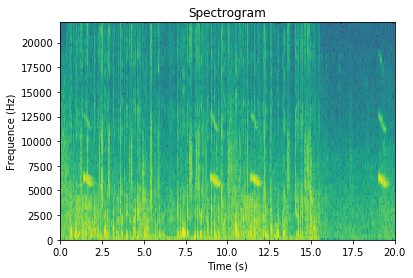

In [445]:
## Spectrogram plot of the superimposed file

temp = plot_spectrogram('test.wav')
print("The output spectrogram has dimensions {}".format(temp.shape))

As mentioned earlier, the expected output T_y of the VAD network will be 2753. The labels will be created keeping this in mind

In [33]:
## Read and store labels
labels = load_labels(base_path = 'vad_data/')

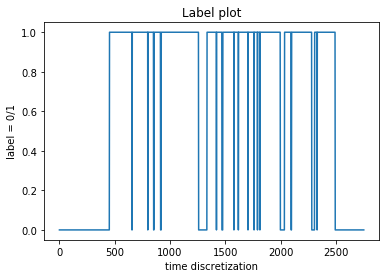

In [34]:
## Plot a label file 
Y = create_label(postion, labels[idx]) # idx = 1
x = [i for i in range(2753)]
plt.ylabel("label = 0/1")
plt.xlabel("time discretization")
plt.plot(x,Y[0])
plt.title("Label plot")

From the plot above I get to clearly discriminate parts of speech and no-speech. This is good news as my function are behaving as expected.


Now that I have made separate helper functions to deal with the preprocessing steps, I can move forward to preparing the entire dataset.

In [146]:
## Putting it all together 
def create_datasets(labels, audios, backgrounds, noise_red = 20.0, calc = False):
    """
    This function puts all of it together"
    - Get random background (and reduce intensity by value 'noise_red')
    - Superimpose audio on background and standardize
    - Export the superimposed audio and get its spectrogram output
    - Calculate labels for corresponding wav file
    
    Args:
    - label (list): list of dictionaries with start and end times
                     of voice for corresponding audio files
    - audios (list): list of audio pydub data structures (1ms discretization)
    - backgrounds (list): list of background pydub data structures 
                         (1ms discretization)
    - noise_red (float) : value by which intensity of backgrond audio is 
                          reduced
    - calc : Object specifying as to whether the dataset should be calculate
             or not
    
    Returns:
    - dataset (list): A list of tuples with containting (data,label)
                      values
    """
    
    dataset = list()
  
    if not calc:
        print('Please load the pickled dataset or set calc = True')
        sys.exit(0)
    
    for n,audio in enumerate(audios):
        
        ## Get random background
        temp_bg_idx = np.random.choice(len(backgrounds),1)[0]
        random_background = backgrounds[temp_bg_idx] - noise_red 
        
        ## Superimpose audio on background and standardize
        X, start_end_time = superimpose_audio(random_background, audio)
        X = standardize(X, -20.0) 
        
        ## Export the superimposed audio and get its spectrogram output
        X_path = "Audio_data/Dataset/file_{}.wav".format(n)
        X.export(X_path, format="wav")
        X = plot_spectrogram(X_path)
        
        ## Calculate labels for corresponding audio
        Y = create_label(start_end_time, labels[n])
        
        temp_tuple = (X,Y)
        
        dataset.append(temp_tuple)
        
    return dataset

The sampling rate and length of the audio file Audio_data/Dataset/file_0.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_1.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_2.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_3.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_4.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_5.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_6.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_7.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_8.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_9.wav is 44100 and 882000
The sampling rate and length o

/Users/allwynjoseph/anaconda/lib/python3.6/site-packages/matplotlib/axes/_axes.py:7235: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


The sampling rate and length of the audio file Audio_data/Dataset/file_13.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_14.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_15.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_16.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_17.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_18.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_19.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_20.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_21.wav is 44100 and 882000
The sampling rate and length of the audio file Audio_data/Dataset/file_22.wav is 44100 and 882000
The sampling rate an

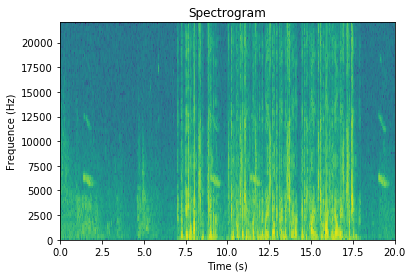

In [147]:
dataset = create_datasets(labels, audios, backgrounds)

### 2.4 - Train, Dev and Test split

Before can go ahead with the training phase, it'd be wise to split the dataset into train, development and test sets. This should help me know as to when to stop training and give me an unbaiased performance of the created VAD

In [226]:
## Splitting into respective indices
dataset_idx = np.random.permutation(len(dataset))
train_idx = dataset_idx[:700]
dev_idx = dataset_idx[700:800]
test_idx = dataset_idx[800:]

## Generating the train, dev and text arrays
X_train, Y_train = splits(dataset, train_idx)
X_dev, Y_dev = splits(dataset, dev_idx)
X_test, Y_test = splits(dataset, test_idx)


## 3 - The Model

With foresight that we're working with timeseries data, I will now put together a Recurrent Neural Network with GRU units to try and predict speech / no speech (1/0) sections for a given audio input. 
Following are the layers used and their repective purposes:
- Conv1D - at the input of the RNN, i'll be adding a convolutional 1-D layer inorder to reduce the input dimension from 11203 to 2753. An encoding of sorts to reduce computational time.
- GRU - Gated Recurrent Units are used to accept incoming time series data. The GRU is used instead of a simple RNN cell as it has a memory cell. LSTM is not used because the GRU cell is simpler - just a memory cell as oppposed to gates and memory.
- Bidirectional - This layer will take into consideration activations from forward and backward pass. Could be intersting with speech data.
- BatchNormalization - Essential for stable gradients
- Dropout - Acts as a regularizer
- TimeDistributed - Essential for adding dense layers on each respective GRU unit output.

**Note** - The most difficult part of creating a network is intializing it with the right parameters and hyperparmeter tuning. Given the lack of time and computational power, I could not do justice to the fact of parameter tuning. So the values with which the below network was initialized with were based on 3 rules:
- Hunches based on past experince
- Values that worked well on other networks with a simiilar objective
- Memory and computational shortage


### 3.1 - Defining the model

In [251]:
def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    ### START CODE HERE ###
    
    # Step 1: CONV layer (≈4 lines)
    X = Conv1D(196, 15, strides=4)(X_input)           
    X = BatchNormalization()(X)                       
    X = Activation('relu')(X)                          
    X = Dropout(0.8)(X)                                

    # Step 2: First GRU Layer (≈4 lines)
    X = Bidirectional(GRU(units = 128, return_sequences = True))(X)    
    X = Dropout(0.8)(X)                                 
    X = BatchNormalization()(X)                         
    
    # Step 3: Second GRU Layer (≈4 lines)
    X = GRU(units = 128 * 2, return_sequences = True)(X)                                  
    X = BatchNormalization()(X)                         
    X = Dropout(0.8)(X)                                 
    
    # Step 4: Time-distributed dense layer (≈1 line)
    X = TimeDistributed(Dense(20, activation = "relu"))(X)
    X = BatchNormalization()(X)                         
    X = Dropout(0.9)(X) 
    X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)

    ### END CODE HERE ###

    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [252]:
Tx = 11023
n_freq = 101
model = model(input_shape = (Tx, n_freq))

In [253]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        (None, 11023, 101)        0         
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 2753, 196)         297136    
_________________________________________________________________
batch_normalization_19 (Batc (None, 2753, 196)         784       
_________________________________________________________________
activation_6 (Activation)    (None, 2753, 196)         0         
_________________________________________________________________
dropout_19 (Dropout)         (None, 2753, 196)         0         
_________________________________________________________________
bidirectional_6 (Bidirection (None, 2753, 256)         249600    
_________________________________________________________________
dropout_20 (Dropout)         (None, 2753, 256)         0         
__________

### 3.2 - Training the model

In [465]:
model = load_model('model/model.h5')
opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

In [256]:
base_path = 'model/'
epochs = 45
batch_size = 16

checkpointer = ModelCheckpoint(filepath= base_path + "model.h5", verbose=0, save_best_only=True)
history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,shuffle=True, 
                    validation_data=(X_dev, Y_dev), verbose=1, callbacks=[checkpointer]).history


Train on 700 samples, validate on 100 samples
Epoch 1/35
700/700 [==============================] - 643s 918ms/step - loss: 0.4331 - binary_accuracy: 0.8282 - val_loss: 0.1972 - val_binary_accuracy: 0.9464

## 4 - Results, Conclusions and Future Work

**Note** - The training of the model was effectuated in two phases, with only the number of epochs changing each time - 10 for the 1st and 35 for the second. There wasn't any particular reason for this, I was just testing as to how much time would the training take and to observe convergence if any. But of course, the second phase of training began only after the model created after 10 epochs of training was loaded. So all in all, the network was trained with 45 epochs and took about 9 hours on a CPU. 


And due to the two phases of training the graphs plotted below show ephocs to be at only 35.

### 4.1 - Results and Conclusions 

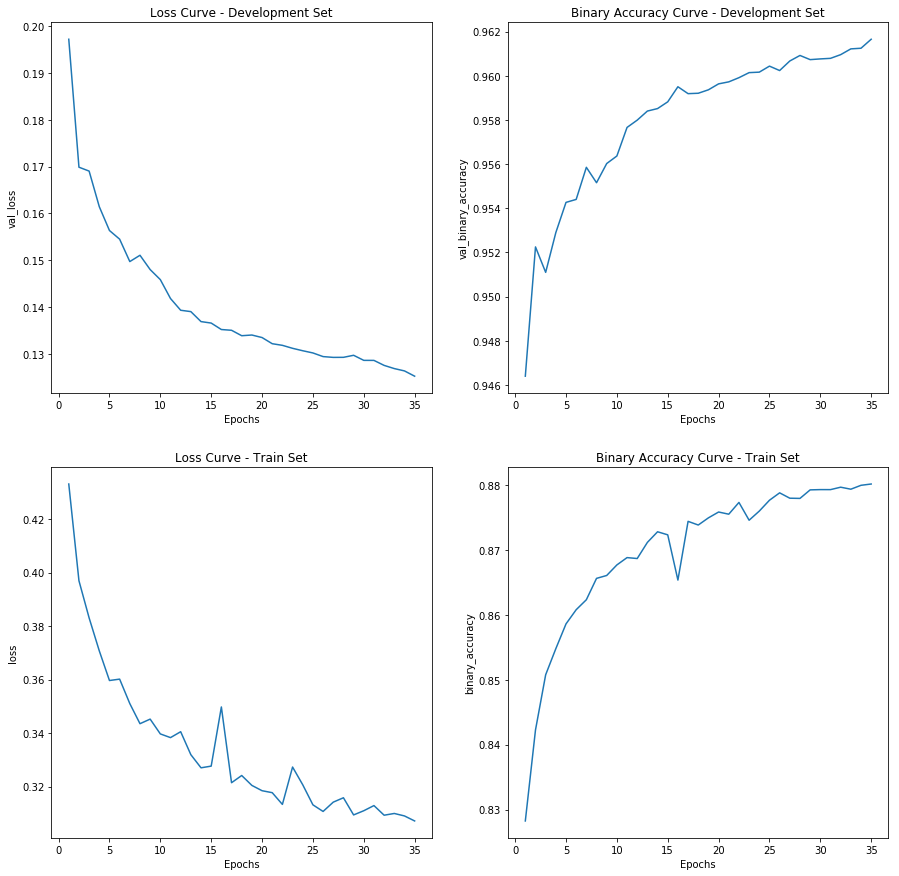

In [468]:
## Plotting the Loss and Accuracy curves 
x = [i for i in range(1,36)]
plt.figure(figsize= (15,15))
titles = ['Loss Curve - Development Set',
          'Binary Accuracy Curve - Development Set',
          'Loss Curve - Train Set','Binary Accuracy Curve - Train Set']
for n,key in enumerate(history.keys()):
    
    plt.subplot(2, 2, n+1)
    plt.title(titles[n])
    plt.plot(x, history[key])
    plt.xlabel('Epochs')
    plt.ylabel(key)

While the model was being trained on the training set, at the end of every epoch, its performance was tested on a development set. So the graphs above plot the losses and binary accuracies of the model on the train and dev sets.

Form the loss curves above we can clearly notice convergence as the loss is being minmized. Additionally, since the loss curves havn't plateaued more training time is highly likely to yield a better classifier. 

As for the accuracy curves, there is a steady increase in binary accuracy with the number of epochs. And again, since the curves havn't plateaued more training time is highly likely to yield a better classifier. 

In [470]:
## Evaluation on the test set
Y_pred = model.predict(X_test)
Y_pred_binary = np.zeros((Y_pred.shape))
for i in range(len(Y_pred)):
    Y_pred_binary[i] = np.where(Y_pred[i] <= 0.5, 0, 1)
tp, fp, tn, fn = evaluate(Y_test, Y_pred_binary) 

## Printing confusion table and corresponding Precision and 
## Recall values
data = [('True Value = 1', tp,fn), ('True Value = 0', fp,tn)]
headers = [' ','Predict Value = 1','Predict Value = 0']
print(tabulate(data, headers=headers))
print()
print("Precision = %6.2f"%((tp/(tp+fp))))
print("Recall = %6.2f"%((tp/(tp+fn))))

                  Predict Value = 1    Predict Value = 0
--------------  -------------------  -------------------
True Value = 1            0.946655             0.0314627
True Value = 0            0.0533452            0.968537

Precision =   0.95
Recall =   0.97


As for the evaluation criteria, I used the good ol trusty confusion matrix (or table in my case). 

- The False Positive (false alarm) rate was at an average of 5.3% much lower than [[this paper by google in 2013](https://static.googleusercontent.com/media/research.google.com/en//pubs/archive/41186.pdf)] and close to resutls from this [[paper from 2017](http://iopscience.iop.org/article/10.1088/1757-899X/231/1/012042/pdf)] - with more training and fine tuning, I believe I can supplant the latter too.
- The False Negative (miss rate) = 3.1 % is quite close to, the [[paper from 2017](http://iopscience.iop.org/article/10.1088/1757-899X/231/1/012042/pdf)] and again, I believe I can come close or even surpass these values with fine tuning and more training.

And on an average, the dataset about 2/3 of the labels assigned to 1 and remaning to 0, it was nice to know the accuracy and recall of my model on the dataset, which was 95% and 97% repectively. Not too bad I believe.

### 4.2 - Future Work


The list of things that can be done is simply endless, but I'm going to try and keep it, short, crip and to the point:

- Train more 
- Hyper parameter tuning
- Add to model complexity (more layers, LSTMS etc)
- Aquire more training data, computational power and RAM
- I detected patterns in predicted output, wherein for all the predictions the first few values were always 1s, when in reality there weren't. This could be attributed to
    - Bias in the classifier
    - less data
    - Too much noise
    - or something completely different
- Having extended the background audio from 10s to 20s, I hadn't smoothened it so as to make the trainsition less conspicuous.
    
    
All in all, an immense learning expernience for me and I hope this notebook of mine would 

## 5 - References

- [[Voice Activity Detection - Tom Bäckström](https://mycourses.aalto.fi/pluginfile.php/146209/mod_resource/content/1/slides_07_vad.pdf)]
- [[VADNET](https://github.com/hcmlab/vadnet/)]
- [[VAD using DNN and Viterbi](http://iopscience.iop.org/article/10.1088/1757-899X/231/1/012042/pdf)]
- [[RNN for VAD](https://static.googleusercontent.com/media/research.google.com/en//pubs/archive/41186.pdf)]
- [[Sequence Models](https://www.coursera.org/learn/nlp-sequence-models)]